# Measuring size of object in image (OpenCV)

For at simplificere opgaven om at identificere kvadratiske arealer og bestemme arealets størrelse, kan der bruges beregninger baseret på konturer, frem for avanceret Machine Learning Algoritmer. 

Fordelen ved at der skal søges efter parkeringsarealer er, at disse er kvadratiske, altså søges der efter serier af konturer, der udgører et kvadrat. 

## Pixels per måleenhed
For at kunne bestemme størrelsen af et objekt i et billede, skal der først bestemmese en ratio for pixels-per-måleenhed (PPM). Dette gøres med et reference object med en kendt størrelse.

Dette betyder at vores reference object har to egenskaber:

- Vi skal kende til dimensionerne af objektet, i form af højde og bredde, i en målbar enhed, såsom millimeter, centimeter eller meter. 
- Reference objektet skal være let genkændeligt i billedet. Dette kan eksempelvis gøres ved altid at placere reference objektet i en bestemt side af billedet, eller at sørge for at reference objektet har en bestemt farve eller form.

I vores Proof Of Concept bruger vi et kaffe-stempelkort som reference objekt, som der ses i billedet nedenfor.

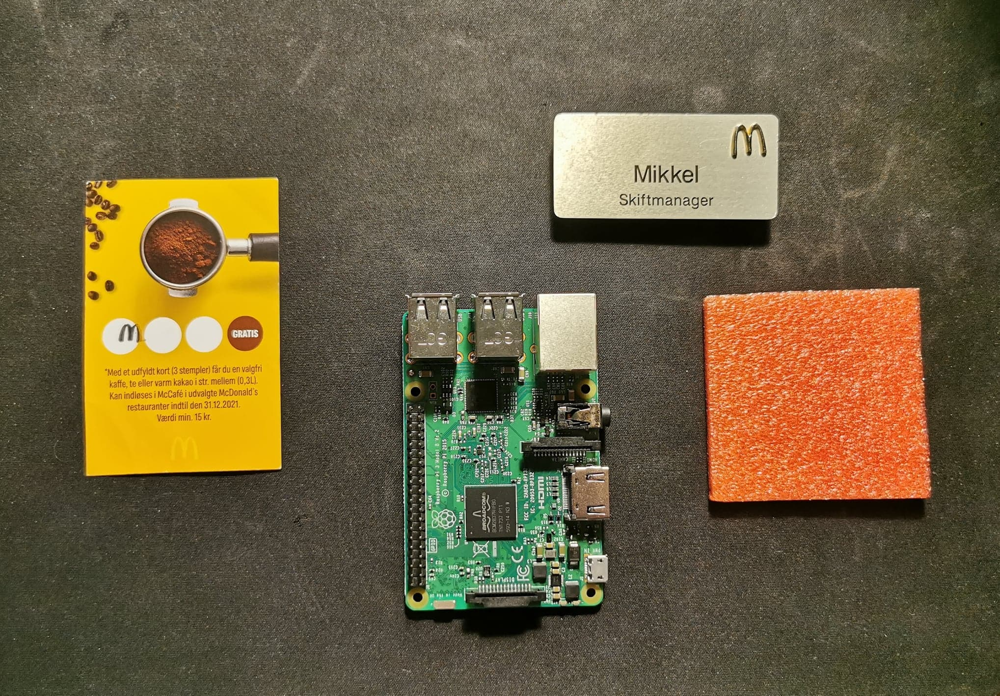

Ved at sikre at vores reference objekt altid er det kvadratiske element længest til venste, og ved at sorterer vores serier af contourer fra venstre mod højre, kan vi bruge det første fundende element, vores reference objekt, til at beregne vores PPM værdi. Formlen defineres nedenfor:

    PixelPerCentimeter = ObjektBredde / KendteBredde
    
Nedenfor ses dimmensionerne af vores refernece objekt.
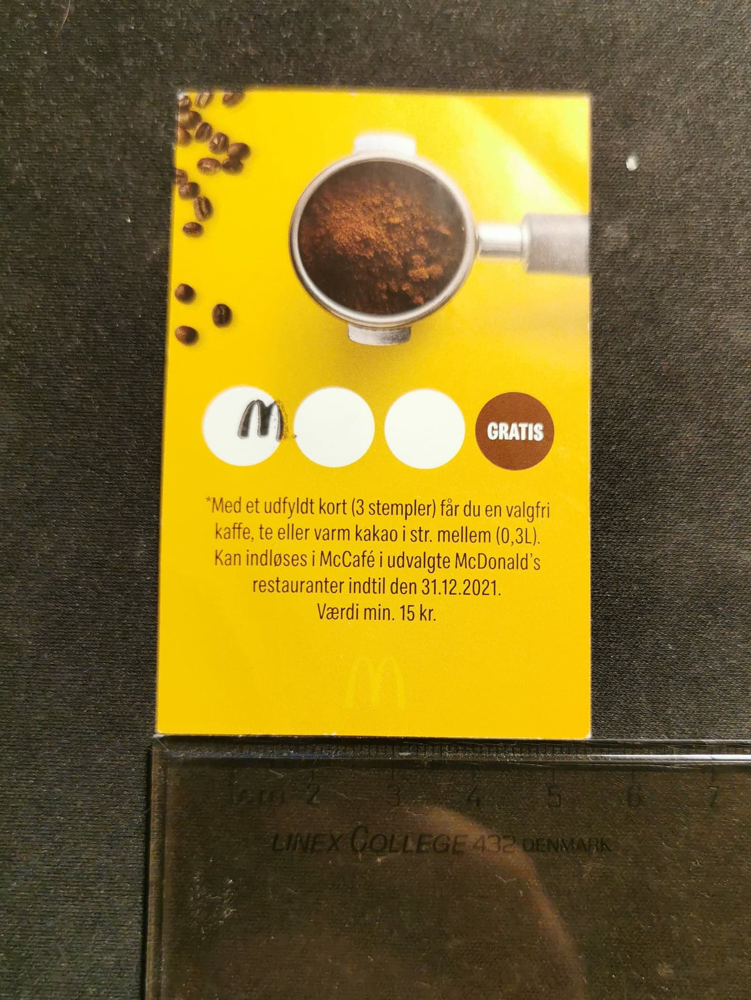

Ud fra billedet kan vi udlede af bredden på reference objektet er 5.5 centimeter. Dette betyder, at hvis bredden af reference objektet eksempelvis er 250 pixels, vil vores regnestykke så således ud:

    PixelsPerCentimeter = 250 / 5.5 
    
Dette betyder at der i eksempel scenariet er en PPM ratio på 45,45 pixels per centimeter. Ved hjælp af den værdi, kan vi beregne størrelserne på resten af objekterne i billedet. 

## At måle størrelsen på objekter med OpenCV

Done getting image 
 Showing it now...


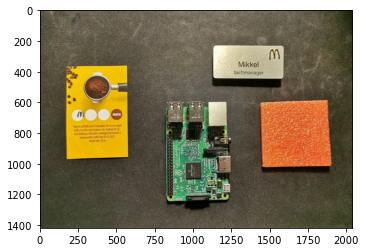

In [1]:
from scipy.spatial import distance as dist
from matplotlib import pyplot as plt
from imutils import perspective
from imutils import contours
import numpy as np
import argparse
import imutils
import cv2

# Actual width of object in centimeters
object_width = 5.5

# Helper method (The Midpoint Formula)
# Compute midpoint between two sets of (x, y)-coordinates
# https://www.purplemath.com/modules/midpoint.htm

def calculate_midpoint(pointA, pointB):
    return (((pointA[0] + pointB[0]) / 2), ((pointA[1] + pointB[1]) / 2))

def show_image_jupyter(image):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)
    plt.show()

image = cv2.imread('.\Size Recognition\Stoerrelse.jpg')
print("Done getting image \n Showing it now...")
show_image_jupyter(image)

For at gøre billedet en smule nemmere at analysere rent matematisk, omdannes det til grayscale og det slørres også en smule. Der brugges i dette tilfælde GaussianBlur, frem for BilateralFilter, da billedet er taget på en mussemåtte, med mange ridser og mærker. 

Done prepping image for analysis 
 Showing it now...


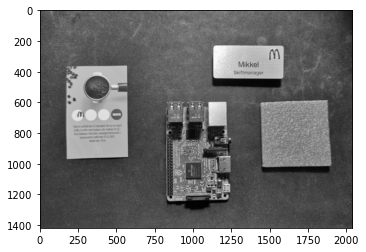

In [2]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
gray = cv2.GaussianBlur(gray, (7, 7), 0)
print("Done prepping image for analysis \n Showing it now...")
show_image_jupyter(gray)

Nu udføres der edge detection via Canny Edge Detection, hvorefter der udføres en udvidelse og erodering af linjerne, for at lukke meget små mellemrum, der kan forekome grundet støv og billedvinkeler.

Done doing edge detection 
 Showing it now...


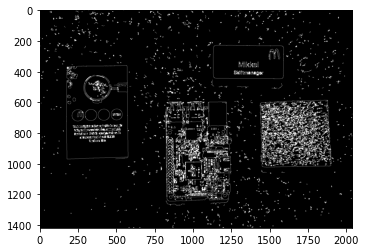

In [3]:
edged = cv2.Canny(gray, 50, 125)
edged = cv2.dilate(edged, None, iterations = 1)
edged = cv2.erode(edged, None, iterations = 1)

print("Done doing edge detection \n Showing it now...")
show_image_jupyter(edged)

Nu skal konturerne findes, hvorefter de bliver sorteret fra venstre mod højre, således at vi kan finde vores reference objekt. 

In [4]:
cntrs = cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cntrs = imutils.grab_contours(cntrs)

(cntrs, _) = contours.sort_contours(cntrs)

Efter at have fundet alle konturer i billedet, gennemgås hver enkelt kontur, for at verificere at den har den rette størrelse. Dernæst tegnes omridset af alle objekter på billedet. 

8.178826828538815
5.5


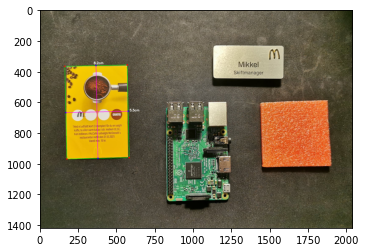

8.773938492601834
5.831263976936948


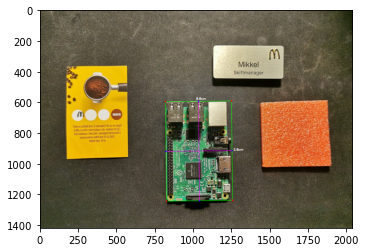

2.9359004076502817
6.224295454151346


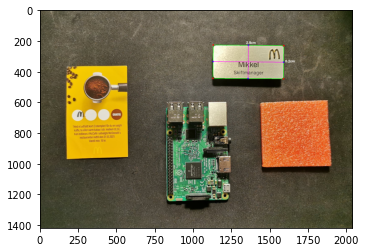

5.3920447091080845
6.097649322882771


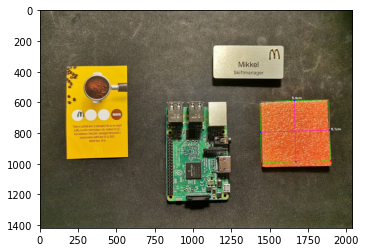

In [6]:
pixel_per_centimer = None

for contour in cntrs:
    # Sorting away all leftover contours from the image that are just noise
    if cv2.contourArea(contour) < 300:
        continue
        
    original_image  = image.copy()
    box = cv2.minAreaRect(contour)
    box = cv2.boxPoints(box)
    box = np.array(box, dtype = 'int')
    
    box = perspective.order_points(box)
    cv2.drawContours(original_image, [box.astype('int')], -1, (0, 255, 0), 2)
    
    for (x, y) in box:
        cv2.circle(original_image, (int(x), int(y)), 5, (0, 0, 255), -1)
        
    # Get coordinates from boundix box
    (top_left, top_right, bottom_right, bottom_left) = box
    
    # Caluclate midpoints
    (tl_tr_X, tl_tr_Y) = calculate_midpoint(top_left, top_right)
    (bl_br_X, bl_br_Y) = calculate_midpoint(bottom_left, bottom_right)
    
    (tl_bl_X, tl_bl_Y) = calculate_midpoint(top_left, bottom_left)
    (tr_br_X, tr_br_Y) = calculate_midpoint(top_right, bottom_right)
    
    # Draw midpoints on image
    cv2.circle(original_image, (int(tl_tr_X), int(tl_tr_Y)), 5, (255, 0, 0), -1)
    cv2.circle(original_image, (int(bl_br_X), int(bl_br_Y)), 5, (255, 0, 0), -1)
    cv2.circle(original_image, (int(tl_bl_X), int(tl_bl_Y)), 5, (255, 0, 0), -1)
    cv2.circle(original_image, (int(tr_br_X), int(tr_br_Y)), 5, (255, 0, 0), -1)
    
    # Draw lines between midpoints
    cv2.line(original_image, (int(tl_tr_X), int(tl_tr_Y)), (int(bl_br_X), int(bl_br_Y)),
             (255, 0, 255), 2)
    cv2.line(original_image, (int(tl_bl_X), int(tl_bl_Y)), (int(tr_br_X), int(tr_br_Y)),
             (255, 0, 255), 2)
    
    # Calculate Euclidean distance between midpoints
    distance_A = dist.euclidean((tl_tr_X, tl_tr_Y), (bl_br_X, bl_br_Y))
    distance_B = dist.euclidean((tl_bl_X, tl_bl_Y), (tr_br_X, tr_br_Y))
    
    # Calulate PPM
    # Check if it's still None so the PPM value is only set by the first object
    if pixel_per_centimer is None:
        pixel_per_centimer = distance_B / object_width #Initialized in the beginning
        
    # Calculate size of object
    dimension_A = distance_A / pixel_per_centimer
    dimension_B = distance_B / pixel_per_centimer
    
    # These objects are to small for it to be actual object
    # but they might still be calulated
    if dimension_A < 2.5 or dimension_B < 2.5:
        continue
        
    print(dimension_A)
    print(dimension_B)
    
    # Draw the objects sizes on the image
    cv2.putText(original_image, "{:.1f}cm".format(dimension_A),
               (int(tl_tr_X - 15), int(tl_tr_Y - 10)), cv2.FONT_HERSHEY_SIMPLEX,
                0.65, (255, 255, 255), 2)
    cv2.putText(original_image, "{:.1f}cm".format(dimension_B),
               (int(tr_br_X + 10), int(tr_br_Y)), cv2.FONT_HERSHEY_SIMPLEX,
               0.65, (255, 255, 255), 2)
    
    show_image_jupyter(original_image)
    cv2.imshow("Image", original_image)
    cv2.waitKey(0)
    